# CIS6800: Project 3: SOLO and FPN (Instance Segmentation)
### Due:
* Part (a) Oct. 18 at 11:59 p.m.
* Part (b) Oct. 23 at 11:59 p.m.

### Instructions:
* This is a group assignment with one submission per group. It is expected that each member of the group will contribute to solving each question. Be sure to specify your teammates when you submit to Gradescope! Collaborating with other groups is not permitted.
* There is no single answer to most problems in deep learning, therefore the questions will often be underspecified. You need to fill in the blanks and submit a solution that solves the (practical) problem. Document the choices (hyperparameters, features, neural network architectures, etc.) you made where specified.
* All the code should be written in Python.
* You may include any code used in previous projects.
* You should expect that a complete training session should last about 6 hours, so you should start part (b) as early as you can!
* To save on compute time, we debugging locally and using colab to train.

## Code Structure
In this assignment, we are only providing the barest templates for your code structure. If you prefer, you can write and debug most of the components in a regular python and only use Jupyter to train. In this case, you might have several files that you import into this notebook, e.g.
* `dataset.py`
* `model.py`
* `train.py`
* `inference.py`

This is shown below. All files should be included in your submission.

In [1]:
try:
    import dataset
    import model
    import train
    import inference
except ModuleNotFoundError:
    pass

## Overview

Instance segmentation can be thought of as a combination of object detection and semantic segmentation, the former of which you already explored in the previous project. A visulization of this relationship can be seen in fig. 1.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig1.png" width=500/></div>
<center>Figure 1: An overview of instance segmentation.</center>  

In this project, you are tasked with implementing an instance segmentation framework know as SOLO (Segmenting Object by LOcations). In a similar manner to YOLO, SOLO produces mask predictions on a dense grid. This means that, unlike many other segmenation frameworks (e.g. Mask-RCNN), SOLO directly predicts the segmentation mask without proposing bounding box locations. An visual summary of SOLO can be seen in fig. 2 and 3.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig2.png" width=200/></div>
<center>Figure 2: SOLO.</center>  

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig3.png" width=600/></div>
<center>Figure 3: SOLO branches.</center>

These dense predictions are produced at several different scales using a Feature Pyramid Network (FPN). Using the last few layers of the backbone, we pass the higher level features from the deeper layers back up to larger features scales using lateral connections, shown in fig. 4. The integration of the FPN into your network will be the primary focus of this project.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig4.png" width=300/></div>
<center>Figure 4: SOLO branches.</center>

## Part A

### Dataset
#### Dataset Structure
The dataset used in this project contains three classes across 3265 images: vehicles, people, and animals. The dataset contains the following elements:

* A numpy array of images ($3 \times 300 \times 400$).
* A numpy array of masks ($300 \times 400$).
* A list of ground truth labels by image.
* A list of bounding boxes by image.

Note that the mask array is flattened; to determine which masks belong to which image, count the number of labels associated with that image. For example, if the first few images have 3, 2, and 4 labels, masks 0-2 would belong to image 1, masks 3-4 would belong to image 2, etc. The masks are ordered correctly to allow for this. You can find the dataset set here: https://drive.google.com/drive/folders/1eP7FtPaWfJ5zLdcsZYl6eyn5EYixkFn8

#### Loading and Batching
You should apply the following transformations to each image:
* Normalize pixel values to $[0,1]$.
* Rescale the image to $800 \times 1066$.
* Normalize each channel with means $[0.485, 0.456, 0.406]$ and standard deviations $[0.229, 0.224, 0.225]$.
* Zero pad the image to $800 \times 1088$.

Since each image will have a different number of objects, you will have to write your own collation function to properly batch the images. An example collate_fn is shown below, along with expected output dimensions.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import h5py
import numpy as np
import os
import torch
from torch import nn
import torchvision
import matplotlib.pyplot as plt
from  matplotlib.patches import Rectangle as rec
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torchvision.transforms.functional import pad, normalize, resize
import copy

!pip install pytorch_lightning &> /dev/null
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks

import warnings
warnings.filterwarnings("ignore")

Mounted at /content/drive


In [3]:
# to do: 
#eval=false
#post processing
#plot
#make pdf

In [2]:
# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")

In [3]:
# images:         (batch_size, 3, 800, 1088)
# labels:         list with len: batch_size, each (n_obj,)
# masks:          list with len: batch_size, each (n_obj, 800,1088)
# bounding_boxes: list with len: batch_size, each (n_obj, 4)

#the 3 functions below are defined for single image and its corresponding (sometimes multiple) masks and bounding boxes
def image_transform(image):
  return pad(normalize(resize(torch.div(image, 255), size=(800,1066)), (0.485,0.456,0.406), (0.229,0.224,0.225)), [11,0])
  
def bboxes_scale(bboxes):
  old_h = 300
  old_w = 400
  new_h = 800
  new_w = 1066
  pad = 22
  scale_x = new_w/old_w
  scale_y = new_h/old_h
  new_bboxes = torch.zeros_like(bboxes)
  new_bboxes[:,0] = scale_x * bboxes[:,0] - pad/2
  new_bboxes[:,1] = scale_y * bboxes[:,1]
  new_bboxes[:,2] = scale_x * bboxes[:,2] + pad/2
  new_bboxes[:,3] = scale_y * bboxes[:,3]
  return new_bboxes

def masks_transform(masks):
  temp_masks = masks.clone()
  temp_masks = pad(resize(temp_masks, size=(800,1066)), [11,0])
  return temp_masks

In [4]:
class SOLODataset(Dataset):
  def __init__(self, rootdir):    #Not taking the transform as an input in the dataloader but rather defining it inside the class function __getitem__
    self.root_path = rootdir
    self.images_path = os.path.join(self.root_path, 'images.h5')  
    self.masks_path = os.path.join(self.root_path, 'masks.h5')    
    self.bboxes_path = os.path.join(self.root_path, 'bboxes.npy')
    self.labels_path = os.path.join(self.root_path, 'labels.npy')
    self.images = np.array(h5py.File(self.images_path, 'r')['data'])    #transformation : 0-1, resize, normalize, pad
    self.masks = np.array(h5py.File(self.masks_path, 'r')['data'])      #transformation : resize, pad
    self.bboxes = np.load(self.bboxes_path, allow_pickle=True, encoding='latin1')    #transformation : scaling and add padding
    self.labels = np.load(self.labels_path, allow_pickle=True, encoding='latin1')
    
    self.indexes = []
    temp = 0
    for i in range(len(self.images)):
      self.indexes.append(temp)
      temp += self.labels[i].shape[0]
    self.indexes = np.array(self.indexes)

  def __getitem__(self, index):
    #example : images[5] has 2 objects in it; so there will be 2 labels, 2 corresponding masks and 2 corresponding bounding boxes
    image = image_transform(torch.from_numpy(self.images[index].astype('float32')).to(device))                       #previously was uint32
    labels = torch.from_numpy(self.labels[index]).to(device)                                                      #int64
    n_obj = labels.shape[0]                  #number of objects present in the image
    masks = masks_transform(torch.from_numpy(self.masks[self.indexes[index] : self.indexes[index] + n_obj].astype('float32')).to(device))     #previously was uint32
    bboxes = bboxes_scale(torch.from_numpy(self.bboxes[index]).to(device))                                         #float32  
    return image, labels, masks, bboxes

  def __len__(self):
    return len(self.images)

In [5]:
def custom_collate(batch):
    images, labels, masks, bounding_boxes = list(zip(*batch))
    return torch.stack(images), labels, masks, bounding_boxes

#### Visualization
In order to validate that you are loading the dataset correct, you should plot at least five example images that include the mask, annotations, and bounding boxes. Examples of such images are shown in fig. 5 and 6. Make sure that the color for each class is consistent!

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig5.png" width=500/></div>
<center>Figure 5: Example visualization.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig6.png" width=500/></div>
<center>Figure 6: Example visualization.</center>

Visualization code

In [227]:
def partA_vis():
  for i in range(25):
    fig = plt.figure()
    ax = fig.add_subplot()
    
    image = torch.permute(sd[i][0].squeeze(0), (1,2,0))
    image = image.cpu().detach().numpy()
    ax.imshow(image)
    masked_img = np.zeros_like(image)

    for n, mask in enumerate(sd[i][2]):
      mask = mask.cpu().detach().numpy()
      three_mask = np.stack((mask, mask, mask), axis=2)

      red, green, blue = np.zeros_like(three_mask), np.zeros_like(three_mask), np.zeros_like(three_mask)

      red[:] = (255 , 0 , 0)
      green[:] = (0 , 255 , 0)
      blue[:] = (0 , 0 , 255)
      mask_colours = {1:red, 2:green, 3:blue}   #vehicle : red, human : green, animal : blue
      colour_idx = sd[i][1].cpu().detach().numpy()
      # print(colour_idx[n])
      masked_img = np.where(three_mask != 0 , mask_colours[colour_idx[n]], image)
      ax.imshow(masked_img, alpha = 0.4)  
    
    for n, bbox in enumerate(sd[i][3]):
      # print("in loop - Bboxes = ", bbox)
      xy = (bbox[0].cpu().detach().numpy(), bbox[1].cpu().detach().numpy()) # TODO : how come use x1 y1. This is the top left corner. https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html
      w = bbox[2] - bbox[0]
      h = bbox[3] - bbox[1]
      w = w.cpu().detach().numpy()
      h = h.cpu().detach().numpy()
      colours = {1:'r', 2:'g', 3: 'b'}
      colour_idx = sd[i][1].cpu().detach().numpy()
      ax.add_patch(rec(xy, w, h , edgecolor=colours[colour_idx[n]], facecolor='none'))

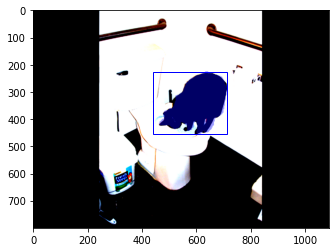

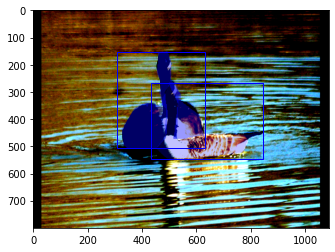

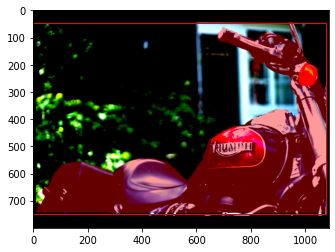

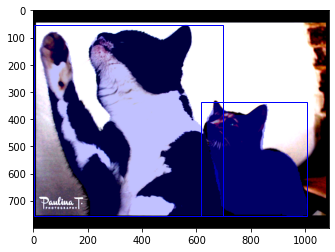

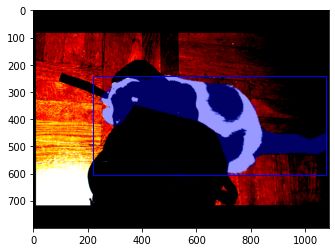

...

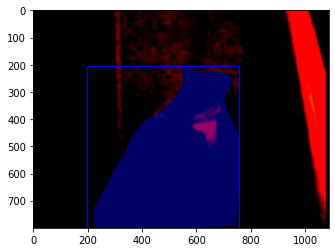

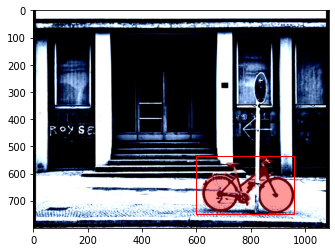

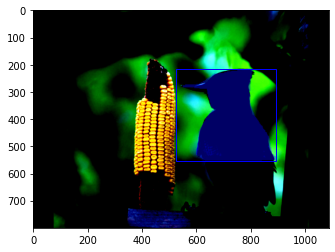

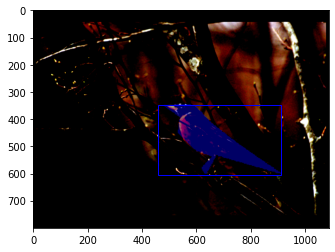

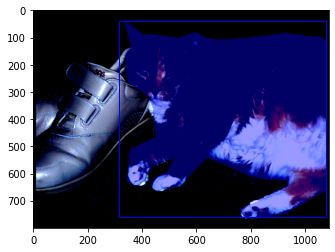

In [228]:
partA_vis()

### Model
#### Architecture
The model architecture is summarized in fig. 7 and tables 1 and 2.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig7.png" width=500/></div>
<center>Figure 7: SOLO branch structure.</center>
<br>
<center>Table 1: Category branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 3\times3\times(C-1)$, stride $= 1$, pad $= 1$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note $C = 4$ here (number of classes + background). |

<br>
<center>Table 2: Mask branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times(256 + 2)$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Two additional input channels represent the $x$ and $y$ positional encoding. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 1\times1\times(\text{num_grid})^2$, stride $= 1$, pad $= 0$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note that $\text{num_grid}$ is different for each layer of the FPN. |

We will be using a pretrained backbone (which includes an FPN), so you will not have to implement those components. A template for the network with along with default parameters is shown below.

#### Feature Pyramid
The feature pyramid extracted below has strides $[4,8,16,32,64]$ over the original image. To match the SOLO paper, this should be interpolated to have strides $[8,8,16,32,32]$.

#### Target Assignment
Some notes about generating the ground truth targets:
* The FPN levels can be though of as different grid sizes cut through the image.
* You assign each target to a certain FPN level if $\sqrt{wh}$ from the bounding box falls within the `scale_range` associated with that level. Note that these overlap, so you may assign the same target to multiple levels.
* A grid cell should be considered as predicting an object if that grid cell falls into the "centre region" of the object.
 * The centre region of an object is its bounding box scaled by `epsilon`.
 * Each grid cell can predict at most one object, but each object can be predicted by more than one grid cell.
 
#### Target Visualization
You should produce visualizations such as fig. 8 and 9 to validate your target assignments.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig8.png" width=500/></div>
<center>Figure 8: Target assignment example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig9.png" width=500/></div>
<center>Figure 9: Target assignment example.</center>

In [212]:
class SOLO(pl.LightningModule):
    _default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5)
    }
    
    def __init__(self, **kwargs):
      self.train_loss = []
      self.train_cat_loss = []
      self.train_mask_loss = []
      self.val_loss = [] 
      self.val_cat_loss = []
      self.val_mask_loss = []

      super().__init__()
      for k, v in {**self._default_cfg, **kwargs}.items():
          setattr(self, k, v)
      
      pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=True)
      self.backbone = pretrained_model.backbone

      self.category_branch = nn.Sequential(
          # conv1
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv2
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv3
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv4
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv5
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv6
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv7
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv_out
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['num_classes'] - 1 , kernel_size= 3, stride = 1, padding = 1, bias = True),
          nn.Sigmoid()
          )
      
      self.mask_branch_1to7 = nn.Sequential(
          # conv1
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] + 2, out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32, num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv2
          nn.Conv2d(in_channels = self._default_cfg['in_channels'], out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv3
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv4
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv5
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv6
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          # conv7
          nn.Conv2d(in_channels = self._default_cfg['in_channels'] , out_channels = self._default_cfg['seg_feat_channels'] , kernel_size= 3, stride = 1, padding = 1, bias = False),
          nn.GroupNorm(num_groups = 32 , num_channels = self._default_cfg['seg_feat_channels']),
          nn.ReLU(),
          )
      self.mask_branch_out = nn.ModuleList([ nn.Sequential(nn.Conv2d(256, g**2, kernel_size=1, bias=True), nn.Sigmoid()) for g in self._default_cfg['num_grids'] ])
          # conv_out    


    def category_branch_forward(self, x):
      out = self.category_branch(x)
      return out

    def mask_branch_forward(self, x, fpn_idx):
      out = self.mask_branch_1to7(x)
      out = self.mask_branch_out[fpn_idx](out)
      return out 
       
    # Forward function should calculate across each level of the feature pyramid network.
    # Input:
    #     images: batch_size number of images
    # Output:
    #     if eval = False
    #         category_predictions: list, len(fpn_levels), each (batch_size, C-1, S, S)
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, 2*feature_h, 2*feature_w)
    #     if eval==True
    #         category_predictions: list, len(fpn_levels), each (batch_size, C-1, S, S)
    #         / after point_NMS (Note : points_NMS is already defined)
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, image_h/4, image_w/4)
    #         / after upsampling

    def forward(self, images, eval=False):
      category_predictions = []
      mask_predictions = []
      feature_pyramid = [v.detach() for v in self.backbone(images).values()] # this has strides [4,8,16,32,64],  but we need strides : [8,8,16,32,32]

      for i in range(len(feature_pyramid)):
        category_branch_input = F.interpolate(feature_pyramid[i], size = (self._default_cfg['num_grids'][i] , self._default_cfg['num_grids'][i] ) , mode = 'bilinear')
        category_branch_output = self.category_branch_forward(category_branch_input)
        #print("Category Branch Output =", category_branch_output.shape )

        if i == 0 : # First layer
          mask_branch_input = F.interpolate(feature_pyramid[i] , size = (int(800 / self.strides[0]) , int(1088 / self.strides[0])))
        elif i == len(feature_pyramid) - 1: # Last Layer
          mask_branch_input = F.interpolate(feature_pyramid[i] , size = (int(800 / self.strides[-1]) , int(1088 / self.strides[-1])))
        else:
          mask_branch_input = feature_pyramid[i]
        # print("mask_branch_input.size(3)", mask_branch_input.size(3))
        # break
        x_channel = torch.arange(mask_branch_input.size(3), device=device).repeat(mask_branch_input.size(0), 1, mask_branch_input.size(2), 1)
        y_channel = torch.arange(mask_branch_input.size(2), device=device).repeat(mask_branch_input.size(0), 1, mask_branch_input.size(3), 1).transpose(2, 3)
        mask_branch_input = torch.cat([mask_branch_input, x_channel, y_channel], dim=1)

        mask_branch_output = self.mask_branch_forward(mask_branch_input, i)
        #print("Mask Branch Output =", mask_branch_output.shape )
        mask_branch_output = F.interpolate(mask_branch_output , size = ( int(2*800 / self.strides[i]) , int(2*1088 / self.strides[i]) ) , mode = 'bilinear')

        category_predictions.append(category_branch_output)
        mask_predictions.append(mask_branch_output)

      #print("category_predictions = ", len(category_predictions))
      #print(category_predictions[i].shape for i in range(len(category_predictions)))
      #print("mask_predictions = ", len(mask_predictions))
      #print(mask_predictions[i].shape for i in range(len(mask_predictions)))
      #if eval is False:
      return category_predictions, mask_predictions
      #else:
        #category_predictions = points_nms(category_predictions)
        #mask_predictions = #upsample


        
    def generate_targets(self, bboxes, labels, masks):
      # the function is for a batch of images

      #image is C H W
      h_img = 800
      w_img = 1088

      category_targets = [[ [] for _ in range(5)] for _ in range(len(labels))] 
      mask_targets = [[ [] for _ in range(5)] for _ in range(len(labels))]
      active_masks = [[ [] for _ in range(5)] for _ in range(len(labels))]

      for img_id in range(len(labels)): #for each image in the batch
      
        # CATEGORY TARGETS PART
        # The FPN levels can be thought of as different grid sizes cut through the image. DONE
        # You assign each target to a certain FPN level if  sqrt(wh) from the bounding box falls within the scale_range associated with that level. DONE
        # Note that these overlap, so you may assign the same target to multiple levels. DONE
        # A grid cell should be considered as predicting an object if that grid cell falls into the "centre region" of the object.  DONE
        # The centre region of an object is its bounding box scaled by epsilon. DONE
        # Each grid cell can predict at most one object, but each object can be predicted by more than one grid cell. DONE
        x_bb = (bboxes[img_id][:,0] + bboxes[img_id][:,2])/2
        y_bb = (bboxes[img_id][:,1] + bboxes[img_id][:,3])/2
        w_bb = bboxes[img_id][:,2] - bboxes[img_id][:,0]
        h_bb = bboxes[img_id][:,3] - bboxes[img_id][:,1]
        root_wh_bb = torch.sqrt(torch.multiply(w_bb, h_bb))
        #print(root_wh_bb)

        #centre region finding for all the objects' bounding boxes  [this is also a box SMH]
        #scaling does not change the centre location
        w_bb_scaled = w_bb * self._default_cfg['epsilon']
        h_bb_scaled = h_bb * self._default_cfg['epsilon']
        x_bb_scaled = x_bb
        y_bb_scaled = y_bb
        #x1, y1, x2, y2
        x1_cen, y1_cen, x2_cen, y2_cen = x_bb_scaled - w_bb_scaled/2, y_bb_scaled - h_bb_scaled/2, x_bb_scaled + w_bb_scaled/2, y_bb_scaled + h_bb_scaled/2

        for i in range(len(bboxes[img_id])):    #for each object
          levels = []
          for idx,lim in enumerate(self._default_cfg['scale_ranges']): #assign level(s) (can belong to 1 or more levels)
            if (root_wh_bb[i] >= lim[0] and root_wh_bb[i]<=lim[1]):
              levels.append(idx)

          for lvl in levels:
            h_gridcell = h_img/self._default_cfg['num_grids'][lvl]
            w_gridcell = w_img/self._default_cfg['num_grids'][lvl]
            S = torch.zeros((self._default_cfg['num_grids'][lvl], self._default_cfg['num_grids'][lvl]))  #(40 x 40) for the first level and so on. the elements store values :1/2/3 or zero if bg

            #rescaling the center region x1, y1, x2, y2 as per the grid cell dimensions of the level
            xA = int(x1_cen[i]/w_gridcell)
            yA = int(y1_cen[i]/h_gridcell)
            xB = int(x2_cen[i]/w_gridcell)
            yB = int(y2_cen[i]/h_gridcell)

            #need to make a range of values from xlow to x high and ylow to yhigh;
            #then make a meshgrid of those values;
            #and then use those meshgrid values as indices of the S matrix to fill in 1,2,3
            _x = torch.arange(xA, xB+1)
            _y = torch.arange(yA, yB+1)
            X, Y = torch.meshgrid(_x, _y)
            for p in range(X.shape[0]):
              for q in range(Y.shape[1]):
                S[X[p][q], Y[p][q]] = labels[img_id][i]
            #print(S)
            category_targets[img_id][lvl].append(S)

            #VERY SKETCHY, RETURN AND REDO
            if(len(category_targets[img_id][lvl])>1):
              #category_targets[lvl] = [category_targets[lvl][-1]]
              category_targets[img_id][lvl] = [sum(category_targets[img_id][lvl])]

        #print(len(category_targets))

        #MASK TARGETS PART
        #abhi bhi object wale loop ke andar rehna hai. per object ke liye hi chal raha hai. iske andar bhi level wise jana hai
        #for lvl in levels get feature_h and feature_w by dividing by corresponding stride of the level DONE
        #interpolate the mask of the object to (2*feature_h, 2*feature_w) remember to squeeze it back to 2 dim DONE
        #clean out the mask by ensuring anything > 0.5 is 1 and < 0.5 is 0
        #make an zeros tensor drawer of (S^2, 2*feature_h, 2*feature_w) DONE
        #make a copy of S and flatten that  DONE
        #wherever S_flat is non zero (1/2/3) get the index  DONE
        #in that flattened index insert the interpolated mask in mask_drawer  DONE
        #remaining of the indices remain empty or zero (jaise bhi drawer ko initialize kiya tha pehle) DONE
            feature_h = h_img/self._default_cfg['strides'][lvl]
            feature_w = w_img/self._default_cfg['strides'][lvl]
            m = masks[img_id][i].clone()
            m_interpolated = F.interpolate(m.unsqueeze(0).unsqueeze(0), size=(int(2*feature_h),int(2*feature_w)), mode='bilinear').squeeze(0).squeeze(0)
            m_interpolated[m_interpolated>0.5] = 1
            m_interpolated[m_interpolated<0.5] = 0
            #print(m_interpolated.shape)
            mask_drawer = torch.zeros(int(S.shape[0]*S.shape[1]), int(2*feature_h), int(2*feature_w), device = device)
            S_flat = copy.deepcopy(S).flatten()
            idx = torch.argwhere(S_flat>0)
            mask_drawer[idx, :, :] = m_interpolated
            #print(mask_drawer)
            mask_targets[img_id][lvl].append(mask_drawer)

            # VERY SKETCHY, RETURN AND MAYBE REDO
            if(len(mask_targets[img_id][lvl])>1):
              mask_targets[img_id][lvl] = [sum(mask_targets[img_id][lvl])]

        #ACTIVE MASKS PART
        #just put 1 in a list of size S^2 in the indices where the mask is present in the drawer
            active_mask = torch.zeros(S_flat.shape[0])
            active_mask[idx] = 1
            active_masks[img_id][lvl].append(active_mask)

            #VERY SKETCHY, RETURN AND MAYBE REDO
            #thoughts : maybe the tensor will be so sparse that the addition won't matter (cheap trick)
            #but ideally we should do an OR operation element wise and fill in a new active_masks tensor
            if(len(active_masks[img_id][lvl])>1):
              active_masks[img_id][lvl] = [sum(active_masks[img_id][lvl])]

      category_targets, mask_targets, active_masks = self.fill_zero(category_targets, mask_targets, active_masks)

      return category_targets, mask_targets, active_masks 

    def fill_zero(self, category_targets, mask_targets, active_masks):
      #replace empty elements of list with zero matrices of appropriate dimensions
      #function is for a batch of images

      for img_id in range(len(category_targets)):
        for lvl in range(5):
          if not category_targets[img_id][lvl]: #if the list element is an empty list
            category_targets[img_id][lvl] = [torch.zeros((self._default_cfg['num_grids'][lvl], self._default_cfg['num_grids'][lvl]))]
          if not mask_targets[img_id][lvl]:
            mask_targets[img_id][lvl] = [torch.zeros((int(self._default_cfg['num_grids'][lvl]*self._default_cfg['num_grids'][lvl]), int(2*800/self._default_cfg['strides'][lvl]), int(2*1088/self._default_cfg['strides'][lvl])))]
          if not active_masks[img_id][lvl]:
            active_masks[img_id][lvl] = [torch.zeros((self._default_cfg['num_grids'][lvl]*self._default_cfg['num_grids'][lvl]))]    #dtype=torch.long

      return category_targets, mask_targets, active_masks

    def visualize(self, images, lst_cat_tgts, lst_mask_tgts, lst_active_masks):
      #function is for a batch of images
      for img_id in range(len(images)):
        for lvl in range(5):
          fig = plt.figure()
          ax = fig.add_subplot()
          ax.set_title("The FPN level is %.i" %lvl)
          ax.imshow(images[img_id].detach().cpu().numpy().transpose(1,2,0))
          
          level_cat_tgts=lst_cat_tgts[img_id][lvl]
          level_mask_tgts=lst_mask_tgts[img_id][lvl]
          level_active_masks=lst_active_masks[img_id][lvl] 
          
          if level_cat_tgts:    #means if the list at the level is not empty, then
              obj1_ind=torch.where(level_cat_tgts[0]==1)
              obj2_ind=torch.where(level_cat_tgts[0]==2)
              obj3_ind=torch.where(level_cat_tgts[0]==3)
              
              if(obj1_ind[0].shape[0]>0): #if there is a vehicle    (label=1, red)
                visualize_mask=(torch.sum(level_mask_tgts[0][obj1_ind[0]*self._default_cfg['num_grids'][lvl]+obj1_ind[1]],axis=0)).unsqueeze(dim=0).unsqueeze(dim=0) #adding to ensure that different objects are accounted for
                visualize_mask=torch.clip(visualize_mask,0,1)   #prevents the warning to show up
                back_interp_mask=F.interpolate(visualize_mask,size=(800,1088),mode='nearest').squeeze(0).squeeze(0) #interopolate the mask back to the original size as the image (800, 1088)
                colorized_back_interp_mask = torch.stack((back_interp_mask, back_interp_mask, back_interp_mask), axis=0)  #becomes (3, 800, 1088)
                colorized_back_interp_mask[0, obj1_ind[0] , obj1_ind[1]] = 1
                colorized_back_interp_mask[1, : , :] = 0
                colorized_back_interp_mask[2, : , :] = 0
                ax.imshow(colorized_back_interp_mask.detach().cpu().numpy().transpose(1,2,0), alpha = 0.4)
              if(obj2_ind[0].shape[0]>0):   #if there is a person   (label=2, green)
                visualize_mask=(torch.sum(level_mask_tgts[0][obj2_ind[0]*self._default_cfg['num_grids'][lvl]+obj2_ind[1]],axis=0)).unsqueeze(dim=0).unsqueeze(dim=0)
                visualize_mask=torch.clip(visualize_mask,0,1)
                back_interp_mask=F.interpolate(visualize_mask,size=(800,1088),mode='nearest').squeeze(0).squeeze(0)
                colorized_back_interp_mask = torch.stack((back_interp_mask, back_interp_mask, back_interp_mask), axis=0)  #becomes (3, 800, 1088)
                colorized_back_interp_mask[0, : , :] = 0
                colorized_back_interp_mask[1, obj1_ind[0] , obj1_ind[1]] = 1
                colorized_back_interp_mask[2, : , :] = 0
                ax.imshow(colorized_back_interp_mask.detach().cpu().numpy().transpose(1,2,0), alpha = 0.4)
              if(obj3_ind[0].shape[0]>0):   #if there is an animal    (label=3, blue)
                visualize_mask=(torch.sum(level_mask_tgts[0][obj3_ind[0]*self._default_cfg['num_grids'][lvl]+obj3_ind[1]],axis=0)).unsqueeze(dim=0).unsqueeze(dim=0)
                visualize_mask=torch.clip(visualize_mask,0,1)
                back_interp_mask=F.interpolate(visualize_mask,size=(800,1088),mode='nearest').squeeze(0).squeeze(0)
                colorized_back_interp_mask = torch.stack((back_interp_mask, back_interp_mask, back_interp_mask), axis=0)  #becomes (3, 800, 1088)
                colorized_back_interp_mask[0, : , :] = 0
                colorized_back_interp_mask[1, : , :] = 0
                colorized_back_interp_mask[2, obj1_ind[0] , obj1_ind[1]] = 1
                ax.imshow(colorized_back_interp_mask.detach().cpu().numpy().transpose(1,2,0), alpha = 0.4)

          plt.show()
    
    def categorical_loss(self, unified_cat_tgts, unified_cat_preds):
      eps = 0.0000001
      focal_loss = torch.tensor(0, dtype=torch.float32).to(device)
      l_cat_per_level = 0.0
      unified_cat_tgts = unified_cat_tgts.type(torch.LongTensor).to(device)  #changed the datatype
      bool_mask_1 = (unified_cat_tgts==1).float()
      bool_mask_2 = (unified_cat_tgts==2).float()
      bool_mask_3 = (unified_cat_tgts==3).float()

      alpha = self._default_cfg['cate_loss_cfg']['alpha']
      gamma = self._default_cfg['cate_loss_cfg']['gamma']

      for img_id in range(len(unified_cat_tgts)):
        focal_loss+= torch.sum(bool_mask_1*alpha*torch.pow(1-unified_cat_preds[img_id][0].to(device),gamma)*torch.log(unified_cat_preds[img_id][0].to(device)+eps))
        focal_loss += torch.sum((1-bool_mask_1)*(1-alpha)*torch.pow(unified_cat_preds[img_id][0].to(device),gamma)*torch.log(1-unified_cat_preds[img_id][0].to(device)+eps))
        focal_loss+= torch.sum(bool_mask_2*alpha*torch.pow(1-unified_cat_preds[img_id][1].to(device),gamma)*torch.log(unified_cat_preds[img_id][1].to(device)+eps))       
        focal_loss += torch.sum((1-bool_mask_2)*(1-alpha)*torch.pow(unified_cat_preds[img_id][1].to(device),gamma)*torch.log(1-unified_cat_preds[img_id][1].to(device)+eps))       
        focal_loss+= torch.sum(bool_mask_3*alpha*torch.pow(1-unified_cat_preds[img_id][2].to(device),gamma)*torch.log(unified_cat_preds[img_id][2].to(device)+eps))       
        focal_loss += torch.sum((1-bool_mask_3)*(1-alpha)*torch.pow(unified_cat_preds[img_id][2].to(device),gamma)*torch.log(1-unified_cat_preds[img_id][2].to(device)+eps))

      l_cat_per_level = (focal_loss/(3*unified_cat_tgts.shape[1]*unified_cat_tgts.shape[2]*len(unified_cat_tgts)))   #per level

      return -l_cat_per_level

    # def categorical_loss(self, unified_cat_tgts, unified_cat_preds):
    #   eps = 0.0000001
    #   unified_cat_tgts = unified_cat_tgts.type(torch.LongTensor).to(device)  #changed the datatype
    #   one_hot = torch.nn.functional.one_hot(unified_cat_tgts, num_classes=4)
    #   print("one hot", one_hot.shape)
    #   cat_tgts_unflattened = one_hot[:,1:]
    #   print("cat_gts_unflattened", cat_tgts_unflattened.shape)


    #   pt = torch.flatten(unified_cat_preds)
    #   cat_tgts_flattened = torch.flatten(cat_tgts_unflattened)
    #   print(cat_tgts_flattened.shape)

    #   print("cat_tgts_flattened", cat_tgts_flattened.shape)  #these 2 values must be the same shape
    #   print("pt", pt.shape)                                  #these 2 values must be the same shape
    #   a = torch.ones(cat_tgts_flattened.shape, device=device) * alpha

    #   idx = cat_tgts_flattened<1
    #   a[idx]  = 1 - a[idx] 
    #   pt[idx] = 1 - pt[idx]

    #   focal_loss = -a*(torch.pow((1-pt),gamma))*torch.log(pt+eps)
    #   focal_loss = focal_loss.to(device)

    #   L_cat = (torch.sum(focal_loss) + eps)/(unified_cat_tgts.shape[0]*3)
      
    #   return -L_cat

    def mask_loss(self, unified_mask_tgts, unified_active_masks, unified_mask_preds):
      d = torch.tensor(0, dtype=torch.float32).to(device)
      L_mask = 0
      for lvl in range(5):
        N_positive = torch.sum(unified_active_masks[lvl]!=0)

        if (N_positive == 0):
          continue

        indicator = unified_active_masks[lvl]!=0
        m_pred = unified_mask_preds[lvl][indicator, :, :].to(device)
        m_gt = unified_mask_tgts[lvl][indicator, :, :].to(device)
        D = (2*torch.sum(m_pred * m_gt))/(torch.sum(torch.pow(m_pred,2)) + torch.sum(torch.pow(m_gt,2)))
        d = (1.0 - D)/N_positive
        L_mask += d
      
      return L_mask

    def loss(self, lst_cat_tgts, lst_mask_tgts, lst_active_masks, lst_cat_preds, lst_mask_preds):
      l_cat = 0
      l_mask = 0
      loss = 0
      for lvl in range(5):
        # categorical loss
        unified_cat_tgts = [torch.cat(lst_cat_tgts[img_id][lvl]) for img_id in range(len(lst_cat_tgts))]
        unified_cat_tgts = torch.stack(unified_cat_tgts, dim=0)
        unified_cat_preds = lst_cat_preds[lvl]
        l_cat += self.categorical_loss(unified_cat_tgts, unified_cat_preds)

      for img_id in range(len(lst_cat_tgts)):
        # mask loss
        unified_mask_tgts = [torch.cat([S_sq_2H_2W for S_sq_2H_2W in fpn_level]) for fpn_level in lst_mask_tgts[img_id]]
        unified_active_masks = [torch.cat([S_sq for S_sq in fpn_level]) for fpn_level in lst_active_masks[img_id]]

        unified_mask_preds = []
        for lvl in range(5):
          unified_mask_preds.append(lst_mask_preds[lvl][img_id])

        #print(len(unified_mask_tgts))
        #print(len(unified_mask_preds))
        l_mask += self.mask_loss(unified_mask_tgts, unified_active_masks, unified_mask_preds)

      #total loss
      lambda_cat = self._default_cfg['cate_loss_cfg']['weight']
      lambda_mask = self._default_cfg['mask_loss_cfg']['weight']

      L_cat = l_cat/len(lst_cat_tgts) #average over the batch size
      L_mask = l_mask/len(lst_cat_tgts) #average over the batch size
      LOSS = lambda_cat * L_cat + lambda_mask * L_mask

      return LOSS, L_cat, L_mask

    def training_step(self, batch, batch_idx):
      images, labels, masks, bboxes = batch
      lst_cat_tgts, lst_mask_tgts, lst_active_masks = self.generate_targets(bboxes, labels, masks)
      lst_cat_preds, lst_mask_preds = self(images)
      train_loss, train_cat_loss, train_mask_loss = self.loss(lst_cat_tgts, lst_mask_tgts, lst_active_masks, lst_cat_preds, lst_mask_preds)

      self.train_loss.append(train_loss.item())
      self.train_cat_loss.append(train_cat_loss.item())
      self.train_mask_loss.append(train_mask_loss.item())

      self.log("train loss", train_loss)
      self.log("categorical loss", train_cat_loss)
      self.log("mask loss", train_mask_loss)
      return {'loss' : train_loss, 'train categorical loss' : train_cat_loss, 'train mask loss': train_mask_loss}

    #defined this to plot the overall training loss, categorical loss and mask loss over each epoch
    def training_epoch_end(self, outputs) -> None:
      train_loss_mean = np.mean(self.train_loss)
      cat_loss_mean = np.mean(self.train_cat_loss)
      mask_loss_mean = np.mean(self.train_mask_loss)

      self.logger.experiment.add_scalar('train loss over each epoch', train_loss_mean, global_step=self.current_epoch)
      self.logger.experiment.add_scalar('categorical loss over each epoch', cat_loss_mean, global_step=self.current_epoch)
      self.logger.experiment.add_scalar('mask loss over each epoch', mask_loss_mean, global_step=self.current_epoch)
      self.train_loss = []  # reset for next epoch
      self.train_cat_loss = []
      self.train_mask_loss = []

    def validation_step(self, batch, batch_idx):
      images, labels, masks, bboxes = batch
      lst_cat_tgts, lst_mask_tgts, lst_active_masks = self.generate_targets(bboxes, labels, masks)
      lst_cat_preds, lst_mask_preds = self(images)
      val_loss, val_cat_loss, val_mask_loss = self.loss(lst_cat_tgts, lst_mask_tgts, lst_active_masks, lst_cat_preds, lst_mask_preds)

      self.val_loss.append(val_loss.item())
      self.val_cat_loss.append(val_cat_loss.item())
      self.val_mask_loss.append(val_mask_loss.item())

      self.log("total loss", val_loss)
      self.log("categorical loss", val_cat_loss)
      self.log("mask_loss", val_mask_loss)
      return {'loss' : val_loss, 'validation categorical loss' : val_cat_loss, 'validation mask loss': val_mask_loss}

    #defined this to plot the overall validation loss, categorical loss and mask loss over each epoch
    def validation_epoch_end(self, outputs) -> None:
      val_loss_mean = np.mean(self.val_loss)
      cat_loss_mean = np.mean(self.val_cat_loss)
      mask_loss_mean = np.mean(self.val_mask_loss)

      self.logger.experiment.add_scalar('validation loss over each epoch', val_loss_mean, global_step=self.current_epoch)
      self.logger.experiment.add_scalar('categorical loss over each epoch', cat_loss_mean, global_step=self.current_epoch)
      self.logger.experiment.add_scalar('mask loss over each epoch', mask_loss_mean, global_step=self.current_epoch)
      self.val_loss = []  # reset for next epoch
      self.val_cat_loss = []
      self.val_mask_loss = []

    def configure_optimizers(self):
      optimizer = torch.optim.SGD(self.parameters(), lr = 0.01, momentum = 0.9, weight_decay=1e-4)   #start the lr=batch_size
      scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones = [27,33], gamma = 0.1)
      return {"optimizer": optimizer, "lr_scheduler": scheduler}


In [225]:
sd = SOLODataset('drive/MyDrive/CIS680/HW3/')

In [196]:
#training subset for sanity check
# subset = []
# for i in range(15):
#   subset.append(sd[i])
# train_set, test_set = torch.utils.data.random_split(subset, [10, 5])

In [219]:
train_size = int(0.8*len(sd))
test_size = len(sd) - train_size
train_set, test_set = torch.utils.data.random_split(sd, [train_size, test_size])

In [220]:
#sanity check that the image values are not full of zeros 
#torch.max(test_set[1][0])

tensor(2.6386, device='cuda:0')

In [221]:
train_loader = DataLoader(train_set, batch_size=8, collate_fn = custom_collate, shuffle=False) #changed the suffle arg to True while training 
test_loader = DataLoader(test_set, batch_size=8, collate_fn = custom_collate, shuffle=False)  #changed the batch size to 8 when trying to visualize results
del sd

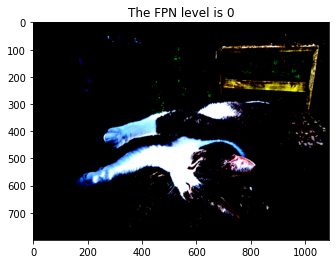

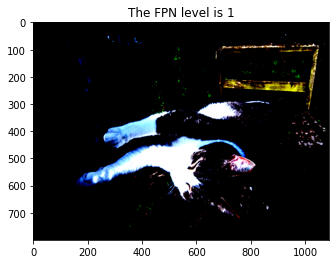

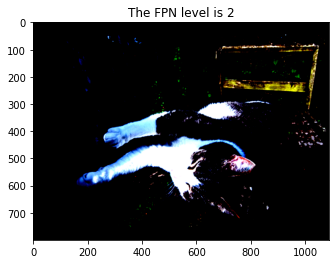

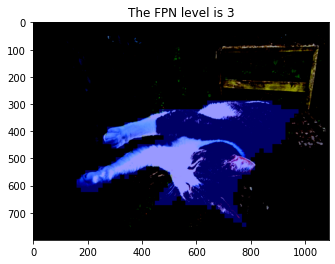

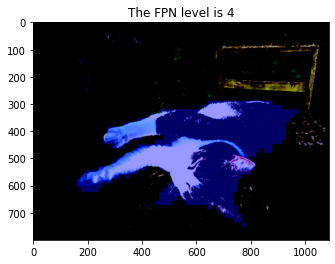

...

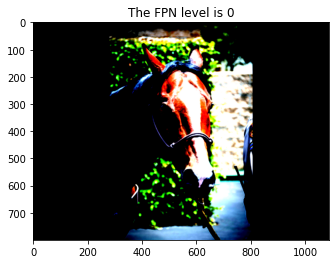

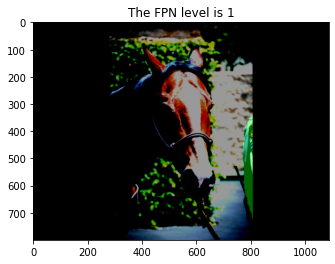

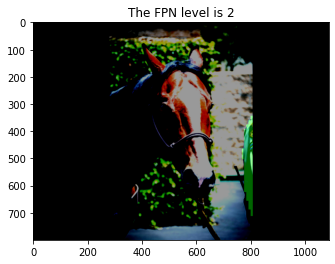

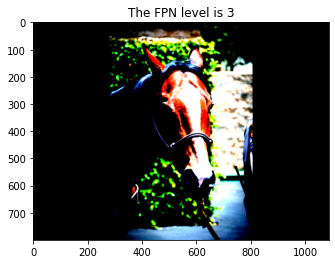

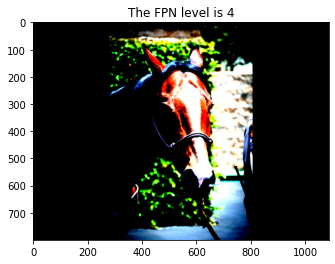

In [222]:
iter_loader = iter(train_loader)  #B=batch_size
batch1 = next(iter_loader)
# print(batch1[0].shape)  #set of B images
# print(batch1[1])        #tuple of B label tensors (may contain multiple labels)
# print(batch1[2])        #tuple of B mask tensors  (may contain multiple masks)
# print(batch1[3])        #tuple of B bbox tensors  (may contain multiple bboxes)
network_obj = SOLO()
lst_cat_tgts, lst_mask_tgts, lst_active_masks = network_obj.generate_targets(batch1[3], batch1[1], batch1[2])
lst_cat_tgts, lst_mask_tgts, lst_active_masks = network_obj.fill_zero(lst_cat_tgts, lst_mask_tgts, lst_active_masks)
network_obj.visualize(batch1[0], lst_cat_tgts, lst_mask_tgts, lst_active_masks)

In [12]:
SOLO_model = SOLO().to(device)

checkpoint_callback = pl_callbacks.ModelCheckpoint(dirpath = "intermediate_model_folder/", monitor = "epoch", filename = "{epoch}", save_top_k = 50)
tb_logger = pl_loggers.TensorBoardLogger("log/")

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [15]:
trainer = pl.Trainer(gpus=1, logger=tb_logger, max_epochs=36, callbacks=[checkpoint_callback])
trainer.fit(SOLO_model, train_loader, test_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type            | Params
-----------------------------------------------------
0 | backbone         | BackboneWithFPN | 26.8 M
1 | category_branch  | Sequential      | 4.1 M 
2 | mask_branch_1to7 | Sequential      | 4.1 M 
3 | mask_branch_out  | ModuleList      | 995 K 
-----------------------------------------------------
35.8 M    Trainable params
222 K     Non-trainable params
36.1 M    Total params
144.283   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=36` reached.


In [21]:
%load_ext tensorboard
%tensorboard --logdir log

<IPython.core.display.Javascript object>

### Part A Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. Should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.

We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so.

## Part B
### Loss
The loss function consists of two parts: category loss and mask loss:
$$L = \lambda_\text{cate} L_\text{cate} + \lambda_\text{mask} L_\text{mask} $$

The category loss is defined as (where $\text{FL}$ is the focal loss)

$$L_\text{cate} = \frac{1}{S^2 C} \sum_{S,S,C} \text{FL}(p_t)$$

$$\text{FL}(p_t) = -\alpha_t (1 - p_t)^\gamma \log{(p_t)}$$

$$(\alpha_t, p_t) = \left\{\begin{array}{lr} (\alpha, \hat{p}) & \text{if }y=1 \\ (1 - \alpha, 1 - \hat{p}) & \text{otherwise}\end{array}\right.$$

while the mask loss is defined as (where $d_\text{mask}$ is the dice loss)

$$L_\text{mask} = \frac{1}{N_\text{positive}} \sum_k \mathbb{1}_{\{p_{i, j} > 0\}} d_\text{mask}(m_k, \hat{m}_k)$$

$$d_\text{mask}(p, q) = 1 - D(p, q)$$

$$D(p, q) = \frac{2 \sum_{x,y}(p_{x,y} \cdot q_{x,y})}{\sum_{x,y}p_{x,y}^2 + \sum_{x,y}q_{x,y}^2}$$

### Post Processing
Post processing consists of three steps: points NMS, concatenation and sorting, and matrix NMS. A summary of each of these steps is provided below. In addition, your final mask prediction should be a binary mask based on the mask thresholding parameter. Some examples of results post-inference are shown in figs. 11-14.


<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig11.png" width=300/></div>
<center>Figure 11: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig12.png" width=300/></div>
<center>Figure 12: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig13.png" width=300/></div>
<center>Figure 13: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig14.png" width=300/></div>
<center>Figure 14: SOLO instance segmentation example.</center>

#### Points NMS
Non-max suppression for the category predictions, applied to each channel sperately. A maxpooling with a kernel size of 2, sample code is included below.

#### Concatenation and Sorting
Here, we merge the predictions across all the FPN levels into a single list of predictions, sorted by their predicted score. This involves rescaling the predicted masks appropriately.

#### Matrix NMS
Inspired by Soft-NMS, MatrixNMS suppresses mask predictions with a lower score based on their similarity to predictions with a higher score in a completely vectorized manner. Sample code is include below.

In [199]:
trainer.validate(dataloaders = test_loader)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/intermediate_model_folder/epoch=0.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from checkpoint at /content/intermediate_model_folder/epoch=0.ckpt


Validation: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
    categorical loss        0.09120527654886246
        mask_loss           0.15942281484603882
       total loss           0.5694737434387207
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'total loss': 0.5694737434387207,
  'categorical loss': 0.09120527654886246,
  'mask_loss': 0.15942281484603882}]

In [200]:
best_model = SOLO_model.load_from_checkpoint("/content/epoch=35.ckpt").to(device)

In [201]:
best_model.eval()
iter_loader = iter(test_loader)
test_batch = next(iter_loader)

In [20]:
#single batch for testing stuff
# iter_loader = iter(train_loader)  #B=batch_size
# batch1 = next(iter_loader)
# print(batch1[0].shape)  #set of B images
# print(batch1[1])        #tuple of B label tensors (may contain multiple labels)
# print(batch1[2])        #tuple of B mask tensors  (may contain multiple masks)
# print(batch1[3])        #tuple of B bbox tensors  (may contain multiple bboxes)
# network_obj = SOLO()
# lst_cat_tgts, lst_mask_tgts, lst_active_masks = network_obj.generate_targets(batch1[3], batch1[1], batch1[2])
# lst_cat_tgts, lst_mask_tgts, lst_active_masks = network_obj.fill_zero(lst_cat_tgts, lst_mask_tgts, lst_active_masks)
# network_obj.visualize(batch1[0], lst_cat_tgts, lst_mask_tgts, lst_active_masks)
# category_predictions, mask_predicitions = network_obj.forward(batch1[0])
# network_obj.loss(lst_cat_tgts, lst_mask_tgts, lst_active_masks, category_predictions, mask_predicitions)

In [202]:
with torch.no_grad():
  cp, mp = best_model(test_batch[0])

In [203]:
#torch.max(cp[0])

tensor(0.0416, device='cuda:0')

In [204]:
# Credit to SOLO Author's code
# This function does NMS on the heat map (category_prediction), grid-level
# Input:
#     heat: (batch_size, C-1, S, S)
# Output:
#     (batch_size, C-1, S, S)
def points_nms(heat, kernel=2):
    # kernel must be 2
    hmax = F.max_pool2d(
        heat, (kernel, kernel), stride=1, padding=1)
    keep = (hmax[:, :, :-1, :-1] == heat).float()
    return heat * keep

# This function performs Matrix NMS
# Input:
#     sorted_masks: (n_active, image_h/4, image_w/4)
#     sorted_scores: (n_active,)
# Output:
#     decay_scores: (n_active,)
def MatrixNMS(sorted_masks, sorted_scores, method, gauss_sigma=0.5):
    n = len(sorted_scores)
    sorted_masks = sorted_masks.reshape(n, -1)
    intersection = torch.mm(sorted_masks, sorted_masks.T)
    areas = sorted_masks.sum(dim=1).expand(n, n)
    union = areas + areas.T - intersection
    ious = (intersection / union).triu(diagonal=1)

    ious_cmax = ious.max(0)[0].expand(n, n).T
    if method == 'gauss':
        decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
    else:
        decay = (1 - ious) / (1 - ious_cmax)
    decay = decay.min(dim=0)[0]
    return sorted_scores * decay

In [205]:
all_final_masks = []
all_final_cats = []
all_final_scores = []
for img_id in range(len(cp[0])):
  mask_list=[]
  category_list=[]
  scores_list=[]
  for lvl in range(len(cp)):
    points_nms_ret = points_nms(cp[lvl][img_id].unsqueeze(0)).squeeze(0) #need to convert to (1,C-1,S,S) to pass to points_nms and then convert back to (C-1, S, S)
    points_nms_ret_flat = points_nms_ret.flatten(start_dim=1,end_dim=-1) #converted to (C-1, S**2)
    conf_max, pred_classes =torch.max(points_nms_ret_flat,dim=0)
    keep_idx = torch.nonzero(conf_max > 0.15 )[:,0]
    #print(keep_idx)
    H_img = 800
    W_img = 1088

    curr_mask = torch.where(mp[lvl][img_id]>=0.5,1,0)
    upsampled_mask = F.interpolate(curr_mask.unsqueeze(dim=0).detach().cpu().float(),size=(int(H_img/4),int(W_img/4)),mode='bilinear').squeeze(0)

    masks_to_keep = upsampled_mask[keep_idx]
    cat_to_keep = pred_classes[keep_idx]
    filtered_scores = conf_max[keep_idx]

    mask_list.append(masks_to_keep)
    category_list.append(cat_to_keep)
    scores_list.append(filtered_scores)

  all_fm_mask = torch.cat(mask_list)    #fm indicates feature maps. here all_fm means all 5 levels of feature maps
  all_fm_cat = torch.cat(category_list)
  all_fm_score = torch.cat(scores_list)

  sorted_idx = torch.argsort(all_fm_score,descending=True)
  sorted_scores = all_fm_score[sorted_idx]
  sorted_cats = all_fm_cat[sorted_idx]
  sorted_masks = all_fm_mask[sorted_idx]

  # print(sorted_masks.shape)
  # print(sorted_scores.shape)
  # print(sorted_cats.shape)

  image_IOU_score = MatrixNMS(sorted_masks.cpu(), sorted_scores.cpu(), method='gauss')
  final_mask = sorted_masks[image_IOU_score>0.2]
  final_cat = sorted_cats[image_IOU_score>0.2]
  final_conf = sorted_scores[image_IOU_score>0.2]

  all_final_masks.append(final_mask)
  all_final_cats.append(final_cat)
  all_final_scores.append(final_conf)

tensor([2], device='cuda:0')


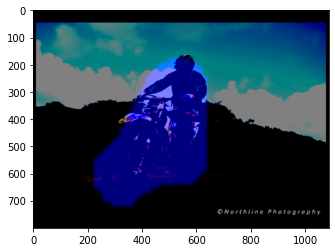

tensor([2], device='cuda:0')


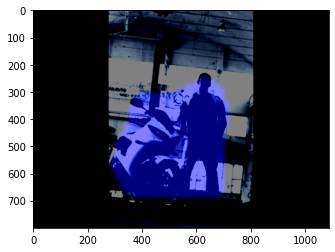

tensor([2], device='cuda:0')


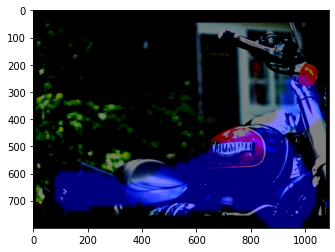

tensor([2], device='cuda:0')


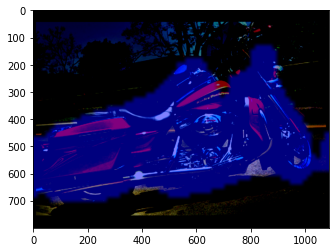

tensor([2], device='cuda:0')


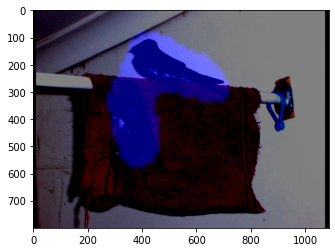

In [206]:
for img_id in range(len(test_batch[0])):
  fig = plt.figure()
  img1 = test_batch[0][img_id].detach().cpu().numpy().transpose(1,2,0)
  plt.imshow(img1)
  mask_vis = np.zeros_like(img1, dtype=np.float64)
  curr_mask = all_final_masks[img_id]
  curr_mask = F.interpolate(curr_mask.unsqueeze(dim=0),size=(800,1088),mode='bilinear').squeeze(0).cpu().float().numpy()
  curr_cat = all_final_cats[img_id]
  if(curr_cat==0): #vehicle
      mask_vis[:,:,0] = curr_mask
  if(curr_cat==1): #person
    mask_vis[:,:,1] = curr_mask
  if(curr_cat==2): #animal
    mask_vis[:,:,2] = curr_mask
  plt.imshow(mask_vis,alpha=0.5)
  plt.show()

Issues faced : \
computation issues, \
some difficulty in understanding post processing

Room for improvement : \
training the backbone \
data augmentation \
dynamic normalization

### Training
#### Optimizer
The SGD optimizer with a weight decay of 1e-4 and a momentum of 0.9 is used. For a batch size of 16, an initial learning rate of 16 is used (this should be scaled appropriately for different batch sizes). You should train for 36 epochs, reducing the learning rate by a factor of 10 at epochs 27 and 33.

#### Data Augemnetation
To achieve better performance, you may wish to explore some data augmentation techniques. You should be able to achieve the necessary performance without any augmentation, however.

#### Checkpointing
Due to the long training time, we highly recommend that you set up regular checkpointing during your training in case your training gets interrupted (e.g. your colab session ending).

### Part B Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Final inference results such as figs. 11-14. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Training and validation loss curves. These should include the focal loss, dice loss, and total loss as seperate quantities.

We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so. You do not, however, need to submit your trained weights.

In addition, you should include a discussion of any issues you encountered during this project and any changes you made to the siggested architecture. If you made any interesting observations or thoughts about potential improvements, you should also include them here.

There will likely be a performance benchmark for this project - more details to be announced.